# 🖼️ Image Processing Techniques with OpenCV

This notebook demonstrates fundamental image processing operations using **OpenCV** and **Matplotlib** in Python. It covers:
- Image loading (grayscale and color)
- Histogram analysis and equalization
- Blurring techniques
- Image sharpening
- Edge detection (Sobel, Laplacian, Canny)

---


##  Load Image in Grayscale and Display

In [ ]:
from google.colab import files
uploaded = files.upload()  # Upload your dataset.zip


Saving dataset.zip to dataset.zip


##  Load Image in Color and Display

In [ ]:
image_dir = "dataset/dataset"


##  Libraries Used

In [ ]:
import zipfile
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt


with zipfile.ZipFile("dataset.zip", 'r') as zip_ref:
    zip_ref.extractall("dataset")


image_dir = "dataset"
image_files = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.jpg')])
print(f"Total images: {len(image_files)}")


Total images: 0


In [ ]:

root_dir = "dataset"


subdirs = [
    os.path.join(root_dir, d)
    for d in os.listdir(root_dir)
    if os.path.isdir(os.path.join(root_dir, d))
]
if len(subdirs) > 0:
    image_dir = subdirs[0]
else:
    image_dir = root_dir

print("Using image directory:", image_dir)


image_files = sorted([
    os.path.join(image_dir, f)
    for f in os.listdir(image_dir)
    if f.lower().endswith(('.jpg','.jpeg','.png'))
])
print(f"Total images: {len(image_files)}")


Using image directory: dataset/dataset
Total images: 20


## 📊 Histogram Plot of Grayscale Image

Here we plot the **intensity histogram** of the grayscale image.  
The histogram shows the frequency of pixel intensity values (0–255), helping us understand the image contrast.
:

Using image directory: dataset/dataset
Total images: 20


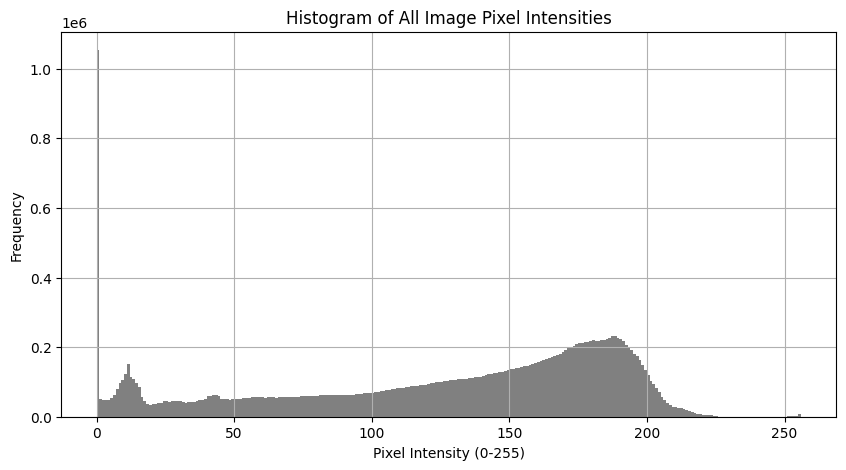

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

root_dir = "dataset"

subdirs = [
    os.path.join(root_dir, d)
    for d in os.listdir(root_dir)
    if os.path.isdir(os.path.join(root_dir, d))
]

if len(subdirs) > 0:
    image_dir = subdirs[0]
else:
    image_dir = root_dir

print("Using image directory:", image_dir)

image_files = sorted([
    os.path.join(image_dir, f)
    for f in os.listdir(image_dir)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
])
print(f"Total images: {len(image_files)}")

# --- Read and collect grayscale pixels ---
all_pixels = []

for img_path in image_files:
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Load as grayscale
    if img is not None:
        all_pixels.extend(img.flatten())  # Add pixel values to list

# Convert to numpy array
all_pixels = np.array(all_pixels)

# --- Plot histogram ---
plt.figure(figsize=(10, 5))
plt.hist(all_pixels, bins=256, range=(0, 256), color='gray')
plt.title("Histogram of All Image Pixel Intensities")
plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

Using image directory: dataset/dataset
Total images: 20


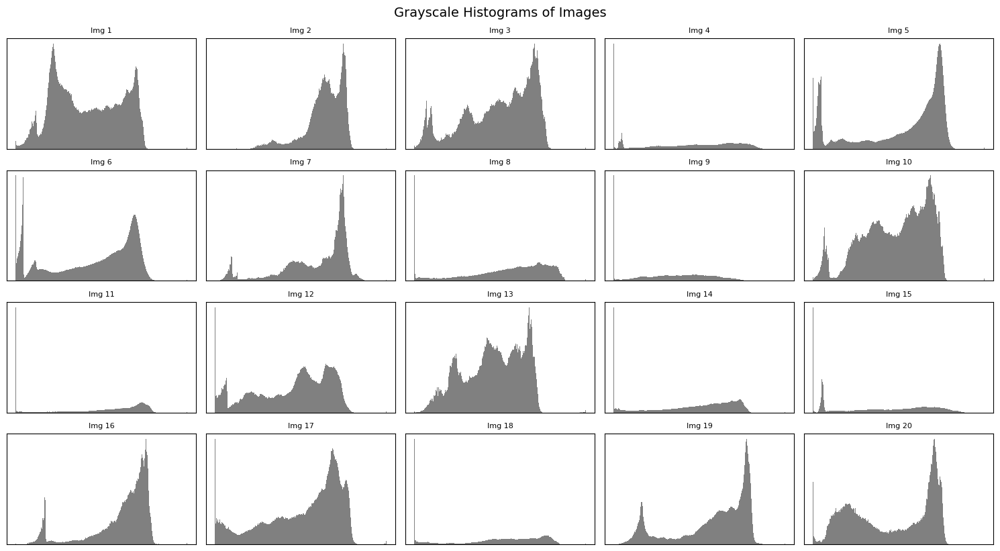

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Set root directory
root_dir = "dataset"

# Get subdirectories
subdirs = [
    os.path.join(root_dir, d)
    for d in os.listdir(root_dir)
    if os.path.isdir(os.path.join(root_dir, d))
]

# Select image directory
if len(subdirs) > 0:
    image_dir = subdirs[0]
else:
    image_dir = root_dir

print("Using image directory:", image_dir)

# Get image files
image_files = sorted([
    os.path.join(image_dir, f)
    for f in os.listdir(image_dir)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
])
print(f"Total images: {len(image_files)}")

# Plot histograms in a grid
num_images = min(20, len(image_files))  # Plot up to 20 images
cols = 5
rows = (num_images + cols - 1) // cols

plt.figure(figsize=(15, 8))  # Adjust figure size

for idx in range(num_images):
    img_path = image_files[idx]
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    plt.subplot(rows, cols, idx + 1)
    plt.hist(img.ravel(), bins=256, range=[0, 256], color='gray')
    plt.title(f'Img {idx+1}', fontsize=8)
    plt.xticks([])  # Hide x-axis ticks
    plt.yticks([])  # Hide y-axis ticks

plt.tight_layout()
plt.suptitle('Grayscale Histograms of Images', fontsize=14, y=1.02)
plt.show()


In [11]:

print(os.listdir("dataset"))


['dataset']


## Sample Image For Testing

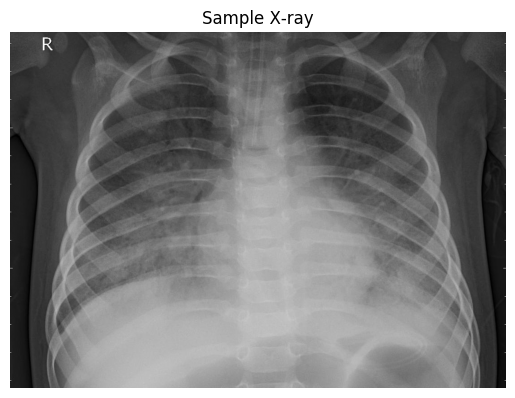

In [12]:
sample = cv2.imread(image_files[0], cv2.IMREAD_GRAYSCALE)
plt.imshow(sample, cmap='gray')
plt.title("Sample X‑ray")
plt.axis('off')
plt.show()


In [13]:
import zipfile, os, cv2, numpy as np, matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr


root_dir = "dataset"
subdirs = [os.path.join(root_dir, d) for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))]
image_dir = subdirs[0] if subdirs else root_dir

image_files = sorted([
    os.path.join(image_dir, f)
    for f in os.listdir(image_dir)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
])
print(f"Total images: {len(image_files)}")


Total images: 20


##  Blurring Techniques: Mean, Gaussian, Median

This section applies various **smoothing (blurring)** techniques:

- **Mean Blur**: Averages pixels in a kernel window.  
- **Gaussian Blur**: Uses a weighted average based on a Gaussian function.  
- **Median Blur**: Replaces each pixel with the median of surrounding pixels — great for reducing salt-and-pepper noise.


Gaussian PSNR: 39.09499915959491
Gaussian SSIM: 0.9729733204525867
Median PSNR: 37.62141447850753
Median SSIM: 0.9530377393670828


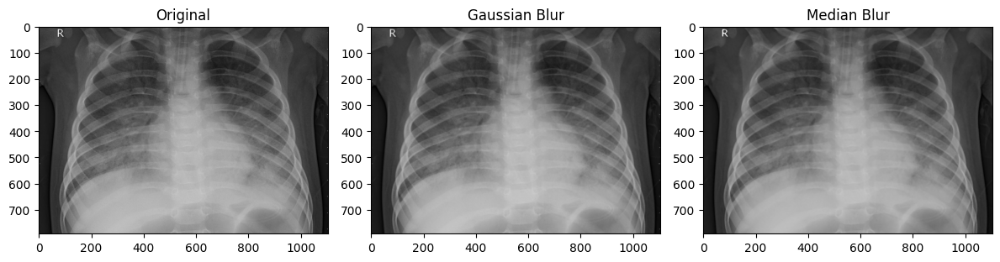

In [14]:
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

img = cv2.imread(image_files[0], cv2.IMREAD_GRAYSCALE)


gaussian_blur = cv2.GaussianBlur(img, (5, 5), 0)


median_blur = cv2.medianBlur(img, 5)


print("Gaussian PSNR:", psnr(img, gaussian_blur))
print("Gaussian SSIM:", ssim(img, gaussian_blur))

print("Median PSNR:", psnr(img, median_blur))
print("Median SSIM:", ssim(img, median_blur))


plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title("Original")

plt.subplot(1, 3, 2)
plt.imshow(gaussian_blur, cmap='gray')
plt.title("Gaussian Blur")

plt.subplot(1, 3, 3)
plt.imshow(median_blur, cmap='gray')
plt.title("Median Blur")

plt.tight_layout()
plt.show()


## 🗂️ Batch Image Processing: Noise Reduction, Edge Detection, Contrast & Frequency Filters on the sample Image

This block automates the processing of **multiple grayscale images** using a variety of techniques. The results are saved into categorized output folders for easy inspection:

---

### 1️⃣ Noise Reduction  
Applied to each image using:
- **Gaussian Blur**: Smooths the image using a Gaussian kernel.
- **Median Blur**: Removes salt-and-pepper noise while preserving edges.

📁 Saved in `outputs/noise_reduction/`

---

### 2️⃣ Edge Detection  
Edges are extracted using:
- **Sobel Operator** (X & Y gradients combined)
- **Laplacian Operator**
- **Canny Edge Detection**

📁 Saved in `outputs/edge_detection/`

---

### 3️⃣ Contrast Enhancement  
Enhances image visibility via:
- **Histogram Equalization**
- **CLAHE (Contrast Limited Adaptive Histogram Equalization)**

📁 Saved in `outputs/contrast_enhancement/`

---

### 4️⃣ Frequency Domain Filtering  
Using **Fourier Transform**, images are filtered in the frequency domain:
- **Low-pass Filter**: Preserves low frequencies (smooth features).
- **High-pass Filter**: Enhances high frequencies (sharp edges and details).

📁 Saved in `outputs/frequency_domain/`

---

 All processed outputs are neatly organized by category for visual comparison.


In [15]:

os.makedirs("outputs/noise_reduction", exist_ok=True)
os.makedirs("outputs/edge_detection", exist_ok=True)
os.makedirs("outputs/contrast_enhancement", exist_ok=True)
os.makedirs("outputs/frequency_domain", exist_ok=True)

for i, path in enumerate(image_files):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

    # ----------- 1. Noise Reduction -----------
    gaussian = cv2.GaussianBlur(img, (5, 5), 0)
    median = cv2.medianBlur(img, 5)
    cv2.imwrite(f"outputs/noise_reduction/{i}_gaussian.jpg", gaussian)
    cv2.imwrite(f"outputs/noise_reduction/{i}_median.jpg", median)

    # ----------- 2. Edge Detection -----------
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
    sobel_combined = cv2.magnitude(sobel_x, sobel_y)
    sobel_combined = cv2.convertScaleAbs(sobel_combined)

    laplacian = cv2.Laplacian(img, cv2.CV_64F)
    laplacian = cv2.convertScaleAbs(laplacian)

    canny = cv2.Canny(img, 50, 150)

    cv2.imwrite(f"outputs/edge_detection/{i}_sobel.jpg", sobel_combined)
    cv2.imwrite(f"outputs/edge_detection/{i}_laplacian.jpg", laplacian)
    cv2.imwrite(f"outputs/edge_detection/{i}_canny.jpg", canny)

    # ----------- 3. Contrast Enhancement -----------
    hist_eq = cv2.equalizeHist(img)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_img = clahe.apply(img)

    cv2.imwrite(f"outputs/contrast_enhancement/{i}_hist_eq.jpg", hist_eq)
    cv2.imwrite(f"outputs/contrast_enhancement/{i}_clahe.jpg", clahe_img)

    # ----------- 4. Frequency Domain Filtering -----------
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)

    rows, cols = img.shape
    crow, ccol = rows // 2, cols // 2

    # Low-pass
    mask_low = np.zeros((rows, cols), np.uint8)
    mask_low[crow-30:crow+30, ccol-30:ccol+30] = 1
    f_low = fshift * mask_low
    img_low = np.abs(np.fft.ifft2(np.fft.ifftshift(f_low)))
    img_low = np.uint8(np.clip(img_low, 0, 255))
    cv2.imwrite(f"outputs/frequency_domain/{i}_lowpass.jpg", img_low)

    # High-pass
    mask_high = np.ones((rows, cols), np.uint8)
    mask_high[crow-30:crow+30, ccol-30:ccol+30] = 0
    f_high = fshift * mask_high
    img_high = np.abs(np.fft.ifft2(np.fft.ifftshift(f_high)))
    img_high = np.uint8(np.clip(img_high, 0, 255))
    cv2.imwrite(f"outputs/frequency_domain/{i}_highpass.jpg", img_high)

print(" All 20 images processed and saved in the 'outputs/' folders.")


 All 20 images processed and saved in the 'outputs/' folders.


##  Visual Comparison of Edge Detection Techniques on the sample Image

This section applies and visualizes three major **edge detection methods** on a grayscale image:

- **Sobel Operator**:  
  Computes gradients in horizontal (X) and vertical (Y) directions. The combined magnitude gives edge strength.

- **Laplacian of Gaussian (LoG)**:  
  Detects edges by calculating second-order derivatives — useful for finding rapid intensity changes.

- **Canny Edge Detection**:  
  A multi-stage algorithm that detects a wide range of edges with high accuracy and low error rate.

📊 The subplot layout provides a side-by-side comparison of:
- Original image  
- Sobel X  
- Sobel Y  
- Combined Sobel  
- Laplacian  
- Canny

This allows for a clear understanding of how each method responds to image features and transitions.


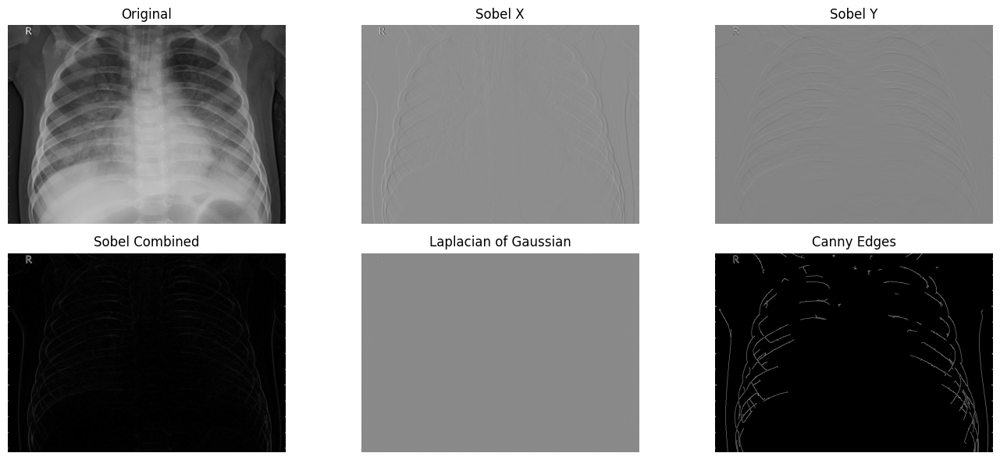

In [16]:

img = cv2.imread(image_files[0], cv2.IMREAD_GRAYSCALE)

# ---- SOBEL ----
sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)  # horizontal
sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)  # vertical
sobel_combined = cv2.magnitude(sobel_x, sobel_y)

# ---- LAPLACIAN ----
laplacian = cv2.Laplacian(img, cv2.CV_64F)

# ---- CANNY ----
canny = cv2.Canny(img, 50, 150)

# ---- Display ----
plt.figure(figsize=(14, 6))

plt.subplot(2, 3, 1); plt.imshow(img, cmap='gray'); plt.title("Original"); plt.axis('off')
plt.subplot(2, 3, 2); plt.imshow(sobel_x, cmap='gray'); plt.title("Sobel X"); plt.axis('off')
plt.subplot(2, 3, 3); plt.imshow(sobel_y, cmap='gray'); plt.title("Sobel Y"); plt.axis('off')
plt.subplot(2, 3, 4); plt.imshow(sobel_combined, cmap='gray'); plt.title("Sobel Combined"); plt.axis('off')
plt.subplot(2, 3, 5); plt.imshow(laplacian, cmap='gray'); plt.title("Laplacian of Gaussian"); plt.axis('off')
plt.subplot(2, 3, 6); plt.imshow(canny, cmap='gray'); plt.title("Canny Edges"); plt.axis('off')

plt.tight_layout()
plt.show()


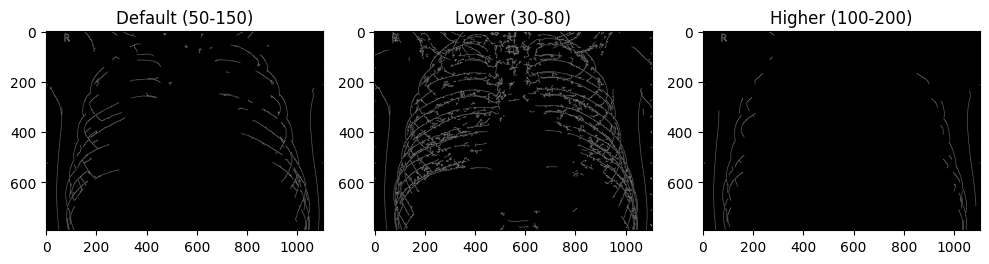

In [17]:
# lower thresholds
canny_low = cv2.Canny(img, 30, 80)

# higher thresholds
canny_high = cv2.Canny(img, 100, 200)

plt.figure(figsize=(10,4))
plt.subplot(1,3,1); plt.imshow(canny, cmap='gray'); plt.title("Default (50-150)")
plt.subplot(1,3,2); plt.imshow(canny_low, cmap='gray'); plt.title("Lower (30-80)")
plt.subplot(1,3,3); plt.imshow(canny_high, cmap='gray'); plt.title("Higher (100-200)")
plt.tight_layout(); plt.show()


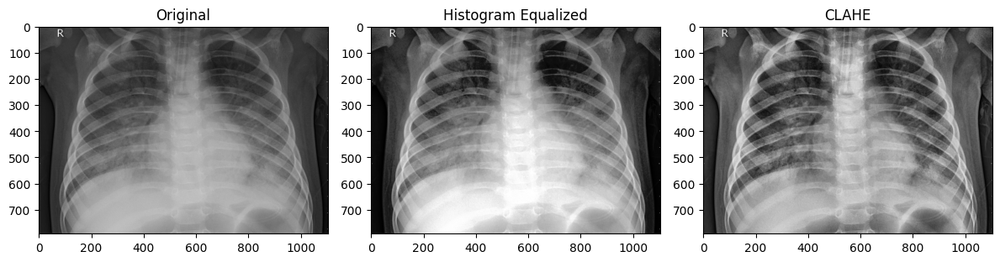

In [18]:
#  grayscale image
img = cv2.imread(image_files[0], cv2.IMREAD_GRAYSCALE)

# Histogram Equalization (global)
hist_eq = cv2.equalizeHist(img)

# CLAHE (adaptive)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_img = clahe.apply(img)

#  results
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1); plt.imshow(img, cmap='gray'); plt.title("Original")
plt.subplot(1, 3, 2); plt.imshow(hist_eq, cmap='gray'); plt.title("Histogram Equalized")
plt.subplot(1, 3, 3); plt.imshow(clahe_img, cmap='gray'); plt.title("CLAHE")
plt.tight_layout(); plt.show()


## 📊 Comparison of Intensity Histograms

This visualization compares the **pixel intensity distributions** of:

- **Original Grayscale Image**
- **Histogram Equalized Image**
- **CLAHE Image (Contrast Limited Adaptive Histogram Equalization)**

Each histogram shows how intensities are spread across the image.  
- Histogram Equalization stretches the contrast globally.
- CLAHE enhances contrast **locally**, avoiding over-amplification in uniform areas.

This helps us visually evaluate how each technique improves contrast.


/tmp/ipython-input-19-3499388360.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(img.ravel(), 256, [0,256], label='Original', alpha=0.5)
/tmp/ipython-input-19-3499388360.py:3: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(hist_eq.ravel(), 256, [0,256], label='Hist Eq', alpha=0.5)
/tmp/ipython-input-19-3499388360.py:4: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(clahe_img.ravel(), 256, [0,256], label='CLAHE', alpha=0.5)


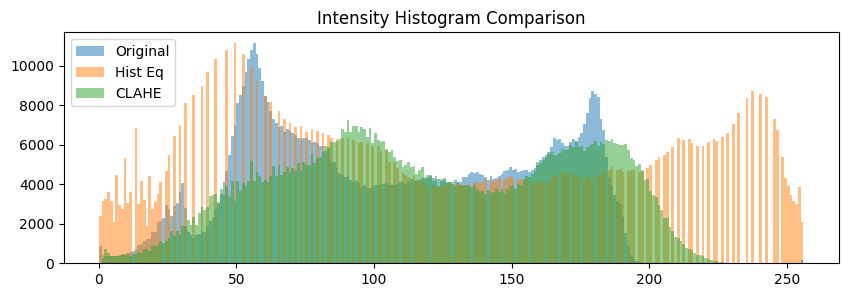

In [19]:
plt.figure(figsize=(10, 3))
plt.hist(img.ravel(), 256, [0,256], label='Original', alpha=0.5)
plt.hist(hist_eq.ravel(), 256, [0,256], label='Hist Eq', alpha=0.5)
plt.hist(clahe_img.ravel(), 256, [0,256], label='CLAHE', alpha=0.5)
plt.title("Intensity Histogram Comparison")
plt.legend()
plt.show()


## 🔬 Frequency Domain Analysis with Fourier Transform

This section demonstrates how to transform an image from the **spatial domain to the frequency domain** using the **Fast Fourier Transform (FFT)**.

Steps performed:

1. **Convert image to grayscale**  
2. **Apply `np.fft.fft2`**: Computes the 2D discrete Fourier Transform.  
3. **Shift the zero-frequency component to the center** using `fftshift` for better visualization.
4. **Compute the Magnitude Spectrum**:  
   - The magnitude is extracted using `np.abs()`.
   - A logarithmic scale is applied (`log(abs)`) to enhance visibility of lower-frequency components.

📈 The magnitude spectrum highlights:
- **Low frequencies** at the center (smooth regions)
- **High frequencies** at the edges (details & noise)

This analysis is useful for **filtering**, **compression**, and **texture analysis**.


In [20]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

img = cv2.imread(image_files[0], cv2.IMREAD_GRAYSCALE)


f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)


magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)


In [21]:
rows, cols = img.shape
crow, ccol = rows // 2, cols // 2
mask = np.zeros((rows, cols), np.uint8)
mask[crow-30:crow+30, ccol-30:ccol+30] = 1

fshift_low = fshift * mask
img_back_low = np.abs(np.fft.ifft2(np.fft.ifftshift(fshift_low)))


In [22]:
mask_high = np.ones((rows, cols), np.uint8)
mask_high[crow-30:crow+30, ccol-30:ccol+30] = 0

fshift_high = fshift * mask_high
img_back_high = np.abs(np.fft.ifft2(np.fft.ifftshift(fshift_high)))


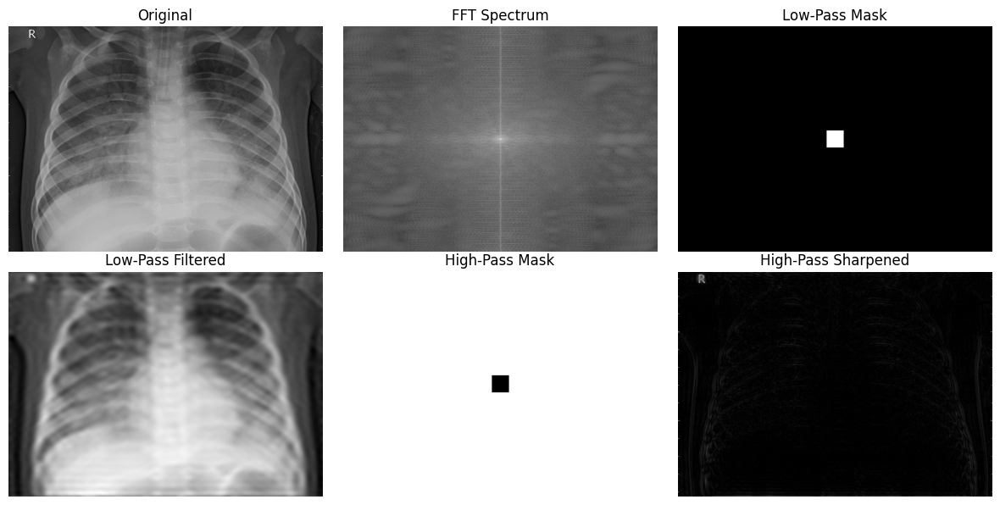

In [23]:
plt.figure(figsize=(12,6))
plt.subplot(2,3,1); plt.imshow(img, cmap='gray'); plt.title("Original"); plt.axis('off')
plt.subplot(2,3,2); plt.imshow(magnitude_spectrum, cmap='gray'); plt.title("FFT Spectrum"); plt.axis('off')
plt.subplot(2,3,3); plt.imshow(mask, cmap='gray'); plt.title("Low-Pass Mask"); plt.axis('off')
plt.subplot(2,3,4); plt.imshow(img_back_low, cmap='gray'); plt.title("Low-Pass Filtered"); plt.axis('off')
plt.subplot(2,3,5); plt.imshow(mask_high, cmap='gray'); plt.title("High-Pass Mask"); plt.axis('off')
plt.subplot(2,3,6); plt.imshow(img_back_high, cmap='gray'); plt.title("High-Pass Sharpened"); plt.axis('off')
plt.tight_layout()
plt.show()


In [24]:
!zip -r outputs.zip outputs/


  adding: outputs/ (stored 0%)
  adding: outputs/frequency_domain/ (stored 0%)
  adding: outputs/frequency_domain/3_highpass.jpg (deflated 0%)
  adding: outputs/frequency_domain/12_lowpass.jpg (deflated 1%)
  adding: outputs/frequency_domain/6_highpass.jpg (deflated 0%)
  adding: outputs/frequency_domain/6_lowpass.jpg (deflated 0%)
  adding: outputs/frequency_domain/10_highpass.jpg (deflated 0%)
  adding: outputs/frequency_domain/8_lowpass.jpg (deflated 0%)
  adding: outputs/frequency_domain/7_highpass.jpg (deflated 0%)
  adding: outputs/frequency_domain/18_lowpass.jpg (deflated 1%)
  adding: outputs/frequency_domain/12_highpass.jpg (deflated 0%)
  adding: outputs/frequency_domain/3_lowpass.jpg (deflated 1%)
  adding: outputs/frequency_domain/9_lowpass.jpg (deflated 1%)
  adding: outputs/frequency_domain/15_highpass.jpg (deflated 0%)
  adding: outputs/frequency_domain/19_highpass.jpg (deflated 0%)
  adding: outputs/frequency_domain/11_highpass.jpg (deflated 0%)
  adding: outputs/freque

---

## 📁 Extending to the Dataset

All the above image processing techniques — including:

- Noise reduction (Gaussian & Median blurring)
- Edge detection (Sobel, Laplacian, Canny)
- Contrast enhancement (Histogram Equalization & CLAHE)
- Frequency domain filtering (Low-pass & High-pass)
- Fourier analysis (Magnitude spectrum visualization)

were demonstrated on a **sample image** for clarity and understanding.

🛠️ Now, the same set of techniques will be applied **systematically to the entire dataset**, with results saved into categorized output folders for organized inspection and analysis.

---


In [25]:
from google.colab import files
files.download("outputs.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

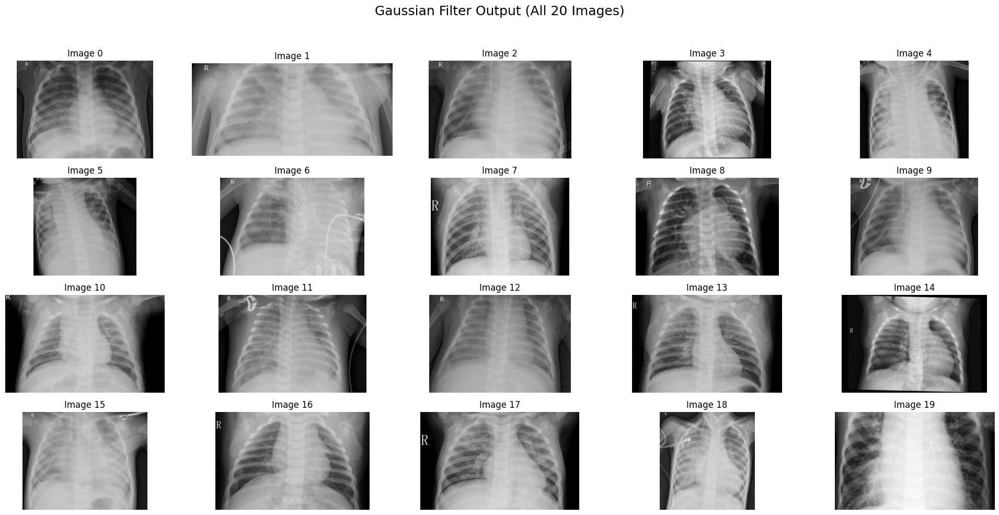

In [26]:
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20, 10))

for i in range(20):
    img = cv2.imread(f"outputs/noise_reduction/{i}_gaussian.jpg", cv2.IMREAD_GRAYSCALE)
    plt.subplot(4, 5, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f"Image {i}")
    plt.axis('off')

plt.suptitle("Gaussian Filter Output (All 20 Images)", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


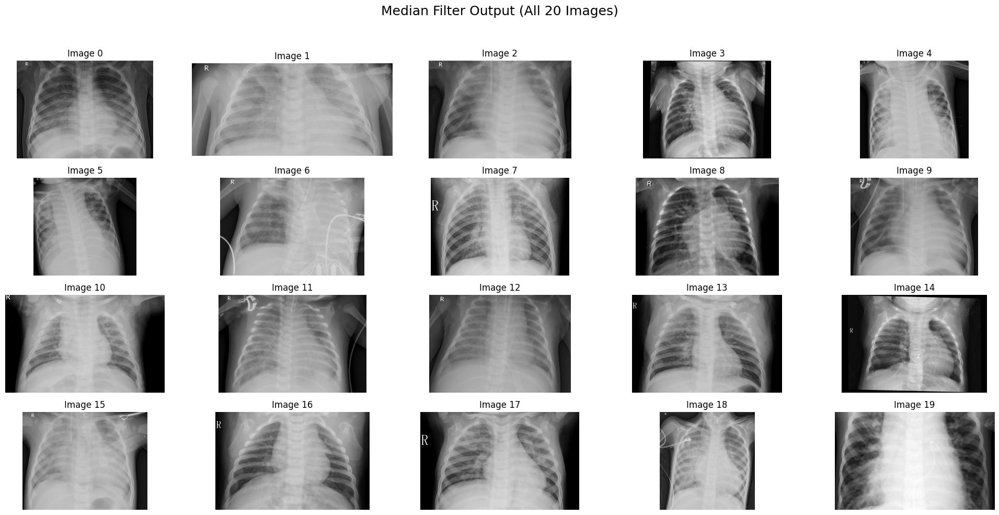

In [27]:
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20, 10))

for i in range(20):
    img = cv2.imread(f"outputs/noise_reduction/{i}_median.jpg", cv2.IMREAD_GRAYSCALE)
    plt.subplot(4, 5, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f"Image {i}")
    plt.axis('off')

plt.suptitle("Median Filter Output (All 20 Images)", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


## 🧠 Edge Detection: Sobel, Laplacian, and Canny

Edge detection helps identify object boundaries. We apply:

- **Sobel Operator**: Computes gradients in X and Y directions.  
- **Laplacian Operator**: Measures second-order derivatives.  
- **Canny Edge Detector**: A robust multi-stage algorithm for detecting a wide range of edges in images.


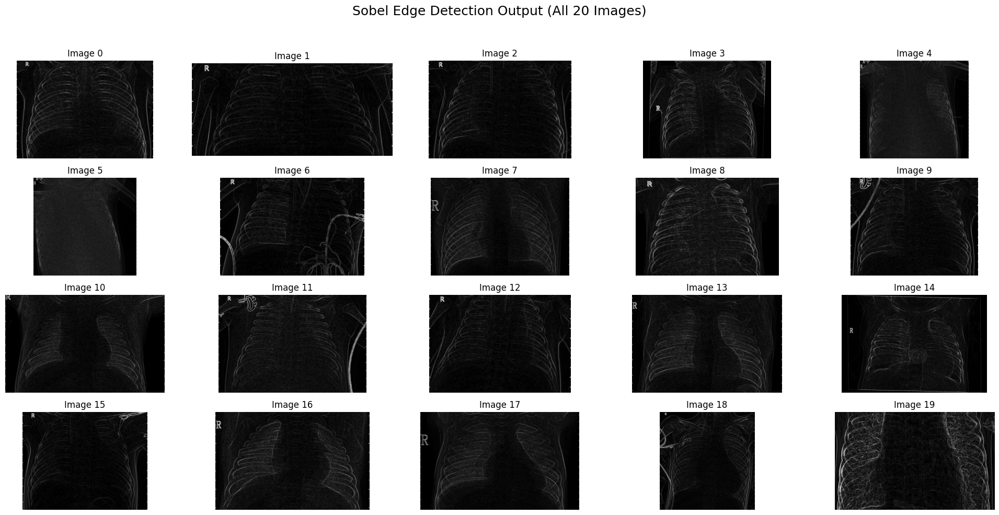

In [28]:
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20, 10))

for i in range(20):
    img = cv2.imread(f"outputs/edge_detection/{i}_sobel.jpg", cv2.IMREAD_GRAYSCALE)
    plt.subplot(4, 5, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f"Image {i}")
    plt.axis('off')

plt.suptitle("Sobel Edge Detection Output (All 20 Images)", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


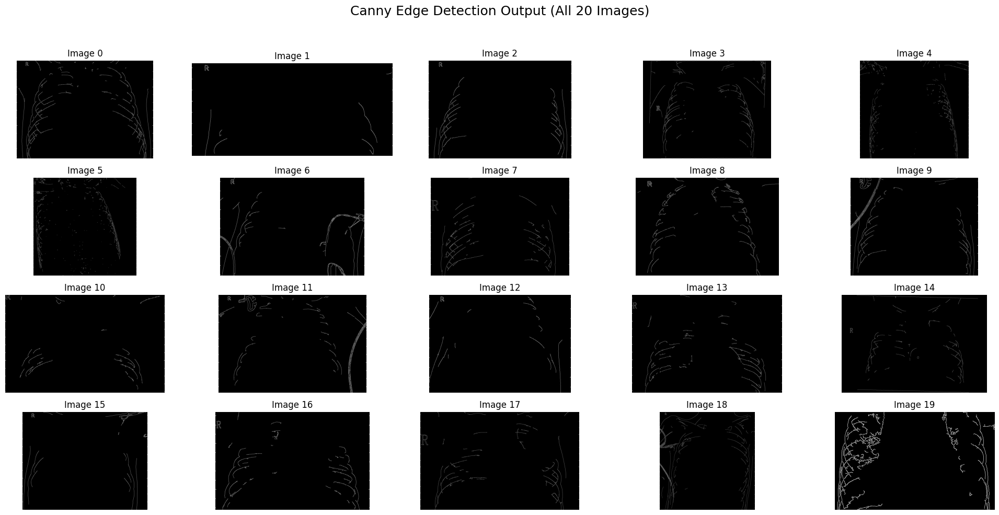

In [29]:
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20, 10))

for i in range(20):
    img = cv2.imread(f"outputs/edge_detection/{i}_canny.jpg", cv2.IMREAD_GRAYSCALE)
    plt.subplot(4, 5, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f"Image {i}")
    plt.axis('off')

plt.suptitle("Canny Edge Detection Output (All 20 Images)", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


## ✨ Histogram Equalization

Histogram equalization is used to **enhance image contrast**.  
It redistributes intensity values so that they span the full range, improving visibility in dark or washed-out images.


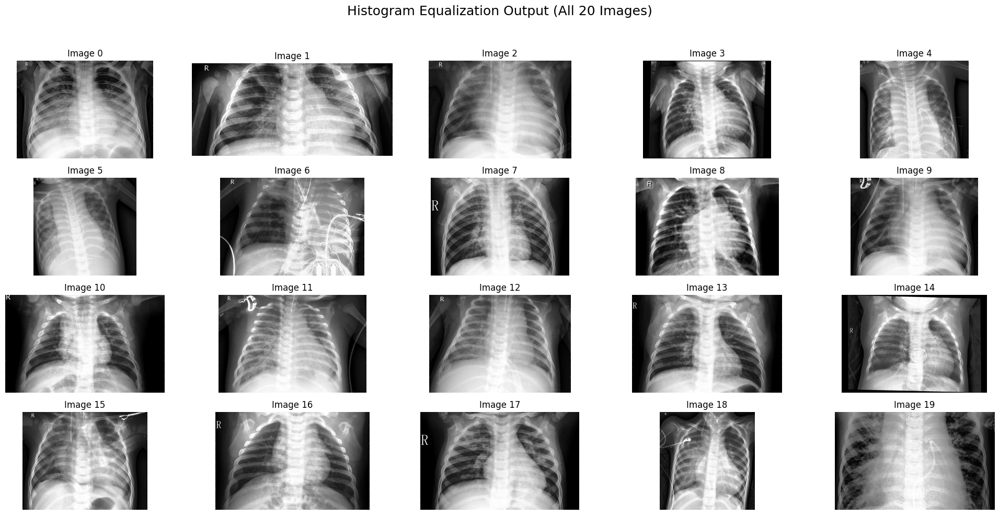

In [30]:
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20, 10))

for i in range(20):
    img = cv2.imread(f"outputs/contrast_enhancement/{i}_hist_eq.jpg", cv2.IMREAD_GRAYSCALE)
    plt.subplot(4, 5, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f"Image {i}")
    plt.axis('off')

plt.suptitle("Histogram Equalization Output (All 20 Images)", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


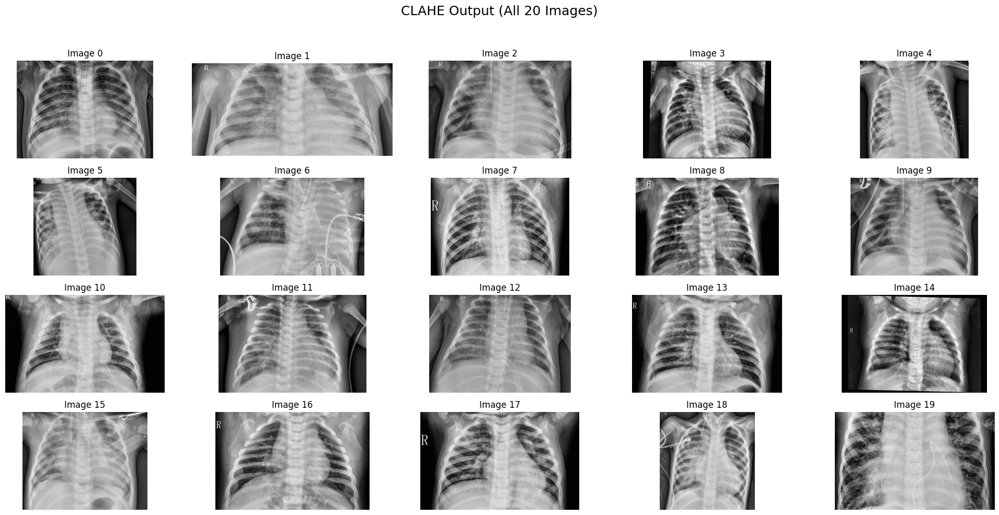

In [31]:
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20, 10))

for i in range(20):
    img = cv2.imread(f"outputs/contrast_enhancement/{i}_clahe.jpg", cv2.IMREAD_GRAYSCALE)
    plt.subplot(4, 5, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f"Image {i}")
    plt.axis('off')

plt.suptitle("CLAHE Output (All 20 Images)", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


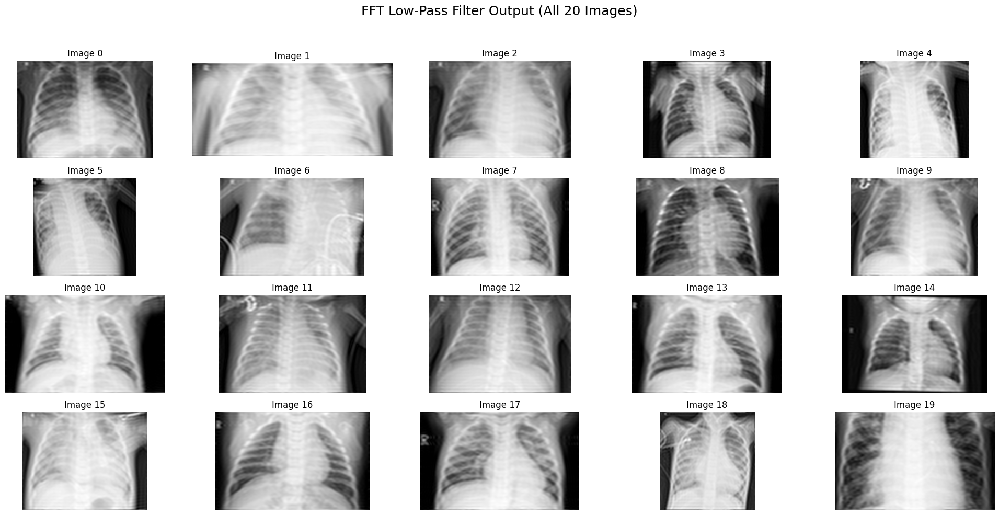

In [32]:
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20, 10))

for i in range(20):
    img = cv2.imread(f"outputs/frequency_domain/{i}_lowpass.jpg", cv2.IMREAD_GRAYSCALE)
    plt.subplot(4, 5, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f"Image {i}")
    plt.axis('off')

plt.suptitle("FFT Low-Pass Filter Output (All 20 Images)", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


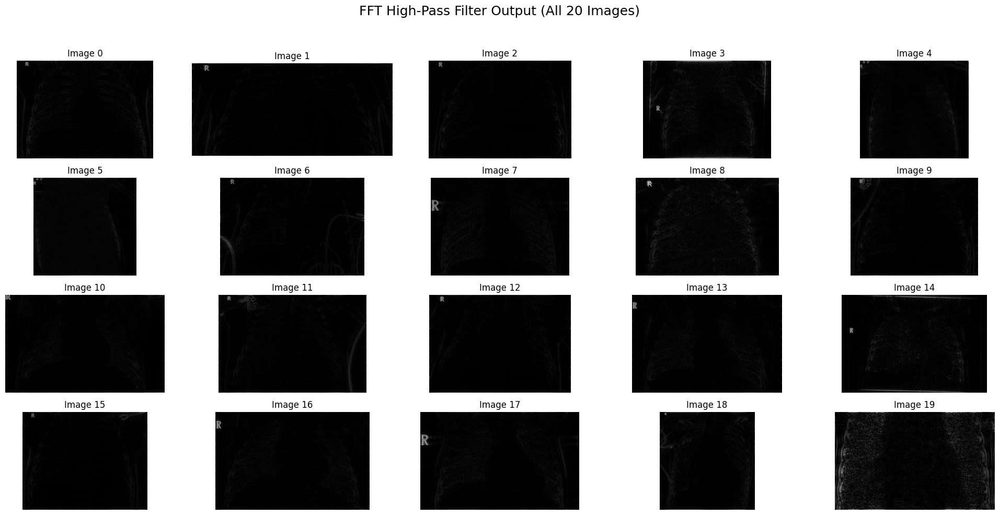

In [33]:
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20, 10))

for i in range(20):
    img = cv2.imread(f"outputs/frequency_domain/{i}_highpass.jpg", cv2.IMREAD_GRAYSCALE)
    plt.subplot(4, 5, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f"Image {i}")
    plt.axis('off')

plt.suptitle("FFT High-Pass Filter Output (All 20 Images)", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


/tmp/ipython-input-34-3790168098.py:11: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(img.ravel(), 256, [0,256])
/tmp/ipython-input-34-3790168098.py:15: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(hist_eq.ravel(), 256, [0,256])
/tmp/ipython-input-34-3790168098.py:19: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(clahe.ravel(), 256, [0,256])


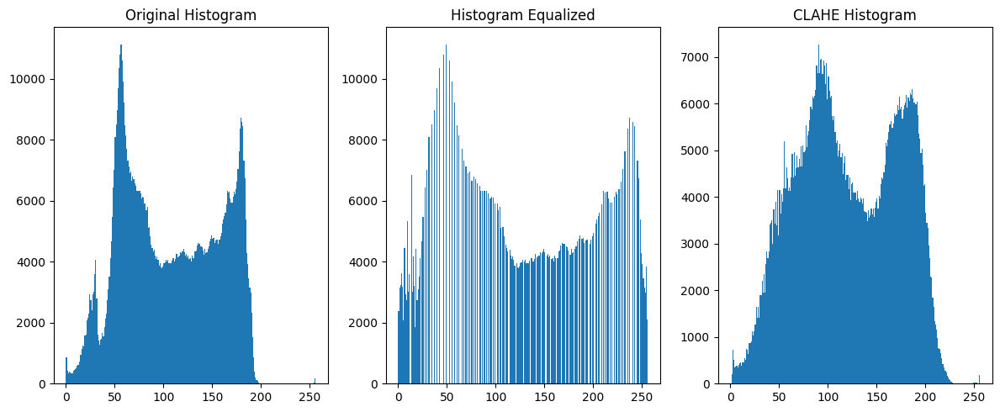

In [34]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread(image_files[0], cv2.IMREAD_GRAYSCALE)
hist_eq = cv2.equalizeHist(img)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8)).apply(img)

plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.hist(img.ravel(), 256, [0,256])
plt.title("Original Histogram")

plt.subplot(1, 3, 2)
plt.hist(hist_eq.ravel(), 256, [0,256])
plt.title("Histogram Equalized")

plt.subplot(1, 3, 3)
plt.hist(clahe.ravel(), 256, [0,256])
plt.title("CLAHE Histogram")

plt.tight_layout()
plt.show()


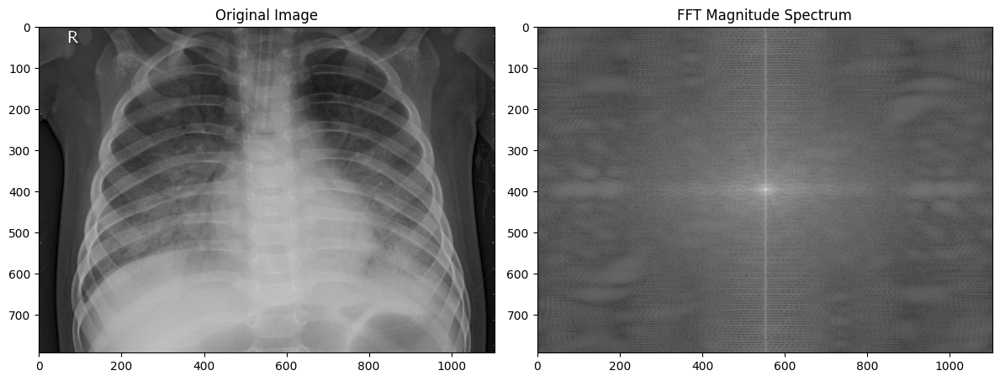

In [35]:
import numpy as np

img = cv2.imread(image_files[0], cv2.IMREAD_GRAYSCALE)
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title("FFT Magnitude Spectrum")

plt.tight_layout()
plt.show()


In [36]:
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

img_original = cv2.imread(image_files[0], cv2.IMREAD_GRAYSCALE)
img_filtered = cv2.imread("outputs/noise_reduction/0_median.jpg", cv2.IMREAD_GRAYSCALE)

print("SSIM:", ssim(img_original, img_filtered))
print("PSNR:", psnr(img_original, img_filtered))


SSIM: 0.9530651471612396
PSNR: 37.61988064142748


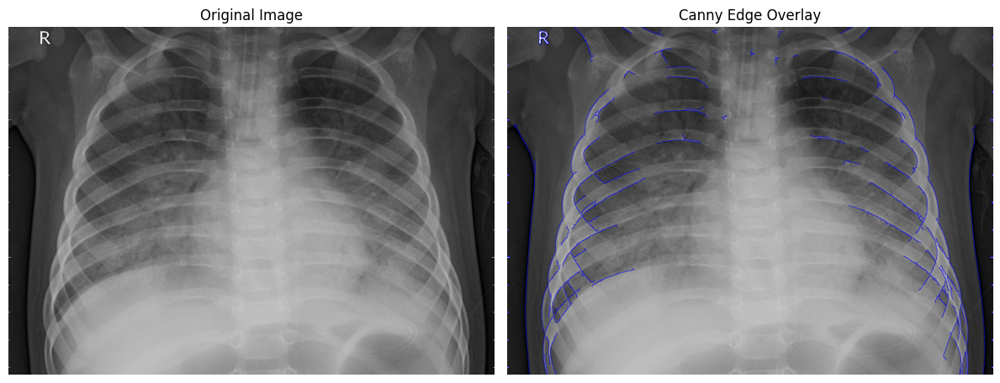

In [37]:
import cv2
import matplotlib.pyplot as plt

# Load original image and apply Canny
img = cv2.imread(image_files[0])  # Read in color
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 50, 150)

# Make a copy of original image
overlay = img.copy()

# Draw red edges on top of original
overlay[edges != 0] = [255, 0, 0]  # Red color (BGR)

# Show result
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.title("Canny Edge Overlay")
plt.axis('off')

plt.tight_layout()
plt.show()


/tmp/ipython-input-38-2617780614.py:15: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(img.ravel(), 256, [0, 256], label='Original', alpha=0.5, color='blue')
/tmp/ipython-input-38-2617780614.py:16: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(gaussian.ravel(), 256, [0, 256], label='Gaussian', alpha=0.5, color='green')
/tmp/ipython-input-38-2617780614.py:17: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(median.ravel(), 256, [0, 256], label='Median', alpha=0.5, color='orange')
/tmp/ipython-input-38-2617780614.py:18: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprec

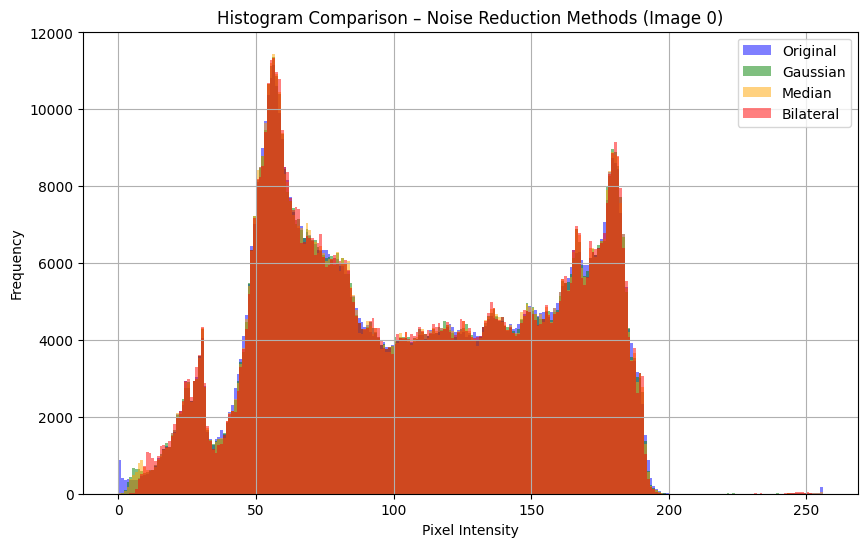

In [38]:
import cv2
import matplotlib.pyplot as plt

# Read grayscale version of image
img = cv2.imread(image_files[0], cv2.IMREAD_GRAYSCALE)

# Apply filters
gaussian = cv2.GaussianBlur(img, (5, 5), 0)
median = cv2.medianBlur(img, 5)
bilateral = cv2.bilateralFilter(img, 9, 75, 75)

# Plot histograms
plt.figure(figsize=(10, 6))

plt.hist(img.ravel(), 256, [0, 256], label='Original', alpha=0.5, color='blue')
plt.hist(gaussian.ravel(), 256, [0, 256], label='Gaussian', alpha=0.5, color='green')
plt.hist(median.ravel(), 256, [0, 256], label='Median', alpha=0.5, color='orange')
plt.hist(bilateral.ravel(), 256, [0, 256], label='Bilateral', alpha=0.5, color='red')

plt.title("Histogram Comparison – Noise Reduction Methods (Image 0)")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.show()


##  Conclusion

This notebook showcased core image processing techniques using OpenCV and NumPy.  
You learned how to apply histogram analysis, smoothing, sharpening, and edge detection — all vital for computer vision tasks.

Explore further by chaining these techniques or testing on different images!
